In [1]:
import torch
import numpy as np
import random
from models import *
import matplotlib.pyplot as plt
from diffusers import LMSDiscreteScheduler, DDIMScheduler, AutoencoderKL
from utils import *
import timeit
import h5py

from interpolation_baselines.diff_space import *
from evaluation import *
from ddim import *

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")
# To the GPU we go!
vae = vae.to(device)


# The noise scheduler
noise_scheduler = LMSDiscreteScheduler(
    beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000
)

In [2]:
# Load Data
M = 9 
Z_data = np.load('data/ddim_latents_{}.npy'.format(M))
ca_labels = np.load('data/norm_labels_{}.npy'.format(M))
labels_raw = np.load('data/raw_labels_{}.npy'.format(M))

labels = ca_labels[:,1]
num_frames = len(labels)

In [3]:
# Lerp and Slerp vectors
steps = len(Z_data) #Video Seq length

ddim_latents = Z_data.reshape(num_frames,4,32,32)

linspace_np = np.linspace(0, 1, steps)[:, np.newaxis].astype(np.float32)
linspace = torch.from_numpy(linspace_np).type(torch.float).to(device)

z1 = torch.tensor(ddim_latents[0:1]).type(torch.float).to(device) #Start point
z2 = torch.tensor(ddim_latents[steps-1:steps]).type(torch.float).to(device) #End point
t_values = linspace

lerp_vectors = lerp(z1, z2, t_values).squeeze(1)
slerp_vectors = slerp(z1, z2, t_values).squeeze(1)

print(lerp_vectors.shape)
print(slerp_vectors.shape)

torch.Size([6201, 4, 32, 32])
torch.Size([6201, 4, 32, 32])


In [4]:
# Prediction from Taylor's Expansion
Z = torch.tensor(Z_data).type(torch.float).to(device)
dt = float(labels[1] - labels[0])

dz  = first_derivative(Z, dt)     # (T, D)
ddz = second_derivative(Z, dt)    # (T, D)

# One-step-ahead Taylor-predictions (cannot predict beyond last index)
tex1_pred = torch.empty_like(Z)
tex1_pred[0] = Z[0]

tex2_pred = torch.empty_like(Z)
tex2_pred[0] = Z[0]

for k in range(Z.shape[0] - 1):
    tex1_pred[k+1] = predict_next_latent_taylor1(Z[k], dz[k], dt)
    tex2_pred[k+1] = predict_next_latent_taylor2(Z[k], dz[k], ddz[k], dt)

tex1_pred = tex1_pred.reshape(num_frames,4,32,32) 
tex2_pred = tex2_pred.reshape(num_frames,4,32,32)   

In [5]:
# For LSTM training
number_list = list(range(6200))
train_block_size = 55
test_block_size = 7
num_blocks = 100
train_blocks = [number_list[i * (train_block_size+test_block_size)  : (i + 1) * train_block_size + test_block_size*i] 
                for i in range(num_blocks)]
test_blocks = [number_list[(i + 1) * train_block_size + test_block_size*i : (i+1)*(train_block_size + test_block_size)]
               for i in range(num_blocks)]  
idx_train = []
idx_test = []
for j in range(num_blocks):
    idx_train = idx_train + train_blocks[j]
    idx_test = idx_test + test_blocks[j]

print("Train:", len(idx_train), "Test:", len(idx_test))

latent_codes = torch.tensor(Z_data[idx_train]).type(torch.float)
time_labels = torch.tensor(labels[idx_train]).type(torch.float)

# Prepare sequences
input_sequences, target_sequences, time_sequences = prepare_sequences(latent_codes, time_labels)

# Combine into a dataset
dataset = TensorDataset(input_sequences, target_sequences, time_sequences)

# Split dataset: 80% training, 20% testing
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Initialize model, optimizer, and loss function
latent_dim = 4096    # Dimensionality of latent codes
hidden_dim = 512     # Hidden size of the LSTM

model = TimeConditionedLatentLSTM(latent_dim=latent_dim, hidden_dim=hidden_dim)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

Train: 5500 Test: 700


In [6]:
# Number of epochs
num_epochs = 500

# Lists to store losses for visualization or analysis later
train_losses = []
test_losses = []

# Training loop
for epoch in range(num_epochs):
   model.train()  # Set model to training mode
   total_train_loss = 0

   # Training phase
   for latent_codes, future_latents, time_labels in train_loader:
       optimizer.zero_grad()
               
       # Forward pass
       output = model(latent_codes, time_labels.unsqueeze(-1))  # Pass time labels for input sequence
       
       # Compute training loss
       train_loss = criterion(output, future_latents)  # Use MSE or appropriate loss function
       train_loss.backward()  # Backpropagation
       optimizer.step()  # Update model parameters
       
       total_train_loss += train_loss.item()  # Accumulate training loss

   # Calculate average training loss for this epoch
   avg_train_loss = total_train_loss / len(train_loader)
   train_losses.append(avg_train_loss)

   # Evaluation phase (on test data)
   model.eval()  # Set model to evaluation mode
   total_test_loss = 0

   with torch.no_grad():  # Disable gradient computation for testing
       for latent_codes, future_latents, time_labels in test_loader:
           # Forward pass
           output = model(latent_codes, time_labels.unsqueeze(-1))  # Pass time labels for input sequence

           # Compute test loss
           test_loss = criterion(output, future_latents)
           total_test_loss += test_loss.item()  # Accumulate test loss

   # Calculate average test loss for this epoch
   avg_test_loss = total_test_loss / len(test_loader)
   test_losses.append(avg_test_loss)
    
   if (epoch + 1) % 10 == 0:
       # Print epoch summary
       print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}")
    

Epoch [10/500], Train Loss: 0.0303, Test Loss: 0.0312
Epoch [20/500], Train Loss: 0.0274, Test Loss: 0.0295
Epoch [30/500], Train Loss: 0.0257, Test Loss: 0.0288
Epoch [40/500], Train Loss: 0.0245, Test Loss: 0.0284
Epoch [50/500], Train Loss: 0.0236, Test Loss: 0.0282
Epoch [60/500], Train Loss: 0.0229, Test Loss: 0.0281
Epoch [70/500], Train Loss: 0.0224, Test Loss: 0.0280
Epoch [80/500], Train Loss: 0.0219, Test Loss: 0.0280
Epoch [90/500], Train Loss: 0.0215, Test Loss: 0.0280
Epoch [100/500], Train Loss: 0.0211, Test Loss: 0.0281
Epoch [110/500], Train Loss: 0.0208, Test Loss: 0.0281
Epoch [120/500], Train Loss: 0.0205, Test Loss: 0.0281
Epoch [130/500], Train Loss: 0.0203, Test Loss: 0.0282
Epoch [140/500], Train Loss: 0.0201, Test Loss: 0.0283
Epoch [150/500], Train Loss: 0.0199, Test Loss: 0.0283
Epoch [160/500], Train Loss: 0.0197, Test Loss: 0.0284
Epoch [170/500], Train Loss: 0.0196, Test Loss: 0.0285
Epoch [180/500], Train Loss: 0.0194, Test Loss: 0.0285
Epoch [190/500], Tr

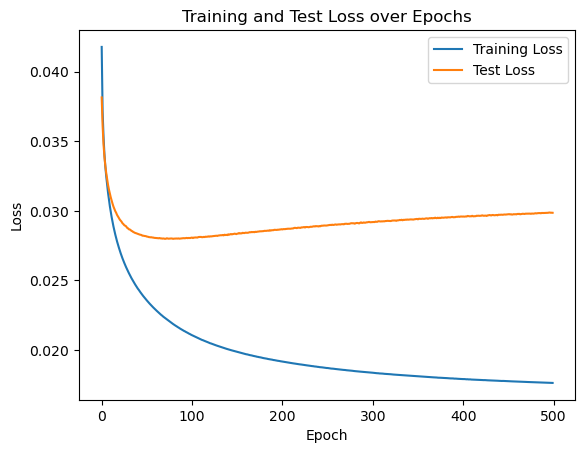

In [7]:
# Optional: Visualize the losses
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss over Epochs')
plt.show()

In [8]:
model.eval() 

latent_codes = torch.tensor(Z_data).type(torch.float) 
time_labels = torch.tensor(labels).type(torch.float)

pred_output = []
mse_loss = nn.MSELoss()
for t in idx_test:
    if t <20:
        out = latent_codes[t:t+1]
    else:   
        out = model(latent_codes[t-20:t].unsqueeze(0), (time_labels[t-20:t].unsqueeze(0)).unsqueeze(-1))
        out = out.squeeze(1)
    pred_output.append(out)
    
    loss = mse_loss(latent_codes[t:t+1].unsqueeze(0),out)
    # print(loss.item())
lstm_output = torch.stack(pred_output).squeeze(1)
print(lstm_output.shape)

/athena/grosenicklab/scratch/sar4018/miniconda3/envs/embedding_env/lib/python3.9/site-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([1, 4096])) that is different to the input size (torch.Size([1, 1, 4096])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


torch.Size([700, 4096])


In [9]:
# For Evaluation 
print('RMSE')
# Trajectories are sampled at the same times (pointwise L2)
def rmse_pointwise(X, Y):  # X,Y: (T,dim) with same T
    return torch.sqrt(torch.mean(torch.sum((X - Y)**2, axis=1)))    

rmse_lerp = rmse_pointwise(latent_codes[idx_test], lerp_vectors[idx_test].reshape(len(idx_test),4*32*32).cpu())
print('Lerp:',rmse_lerp.item())

rmse_slerp = rmse_pointwise(latent_codes[idx_test], slerp_vectors[idx_test].reshape(len(idx_test),4*32*32).cpu())
print('Slerp:',rmse_slerp.item())

rmse_lstm = rmse_pointwise(latent_codes[idx_test], lstm_output)
print('LSTM:',rmse_lstm.item())

rmse_tex1 = rmse_pointwise(latent_codes[idx_test], tex1_pred[idx_test].reshape(len(idx_test),4*32*32).cpu())
print('TEX-1:', rmse_tex1.item())

rmse_tex2 = rmse_pointwise(latent_codes[idx_test], tex2_pred[idx_test].reshape(len(idx_test),4*32*32).cpu())
print('TEX-2:', rmse_tex2.item())

RMSE
Lerp: 16.576383590698242
Slerp: 17.62769889831543
LSTM: 12.196895599365234
TEX-1: 11.303126335144043
TEX-2: 8.498427632730454e-07


In [10]:
X_data = np.load('data/X_data_{}.npy'.format(M))[idx_test]

Z_lerp = lerp_vectors[idx_test]  
Z_slerp = slerp_vectors[idx_test]
Z_lstm = lstm_output.reshape(len(lstm_output), 4, 32, 32).to(device)
Z_tex1 = tex1_pred[idx_test]
Z_tex2 = tex2_pred[idx_test]

#print(X_data.shape)
i = list(range(0,len(idx_test),14))
real_images = torch.tensor(X_data[i]).type(torch.float) 

In [11]:
niters = 50000
# Load pretrained model
save_models_folder = 'output/saved_models'

Filename_LDM = save_models_folder + '/CcLDM_checkpoint_intrain/CcLDM_checkpoint_niters_{}.pth'.format(niters)
print("Loading pre-trained continuous conditional latent diffusion model >>>")
checkpoint = torch.load(Filename_LDM, map_location=device,weights_only=True)
#checkpoint = torch.load(Filename_LDM)
netLDM = cont_cond_unet_diffusion_model().to(device)
netLDM = nn.DataParallel(netLDM) 

# Adjust checkpoint keys if necessary
checkpoint_state_dict = checkpoint['netLDM_state_dict']
adjusted_state_dict = {}

for key, value in checkpoint_state_dict.items():
    # Replace naming inconsistencies
    new_key = key.replace("query", "to_q").replace("key", "to_k").replace("value", "to_v").replace("proj_attn", "to_out.0")
    adjusted_state_dict[new_key] = value

# Load the adjusted state dict
netLDM.load_state_dict(adjusted_state_dict, strict=True)

Loading pre-trained continuous conditional latent diffusion model >>>


<All keys matched successfully>

In [12]:
inf_steps = 1000
labels_test = torch.tensor(ca_labels[idx_test]).type(torch.float).unsqueeze(-1).to(device)

  0%|          | 0/999 [00:00<?, ?it/s]

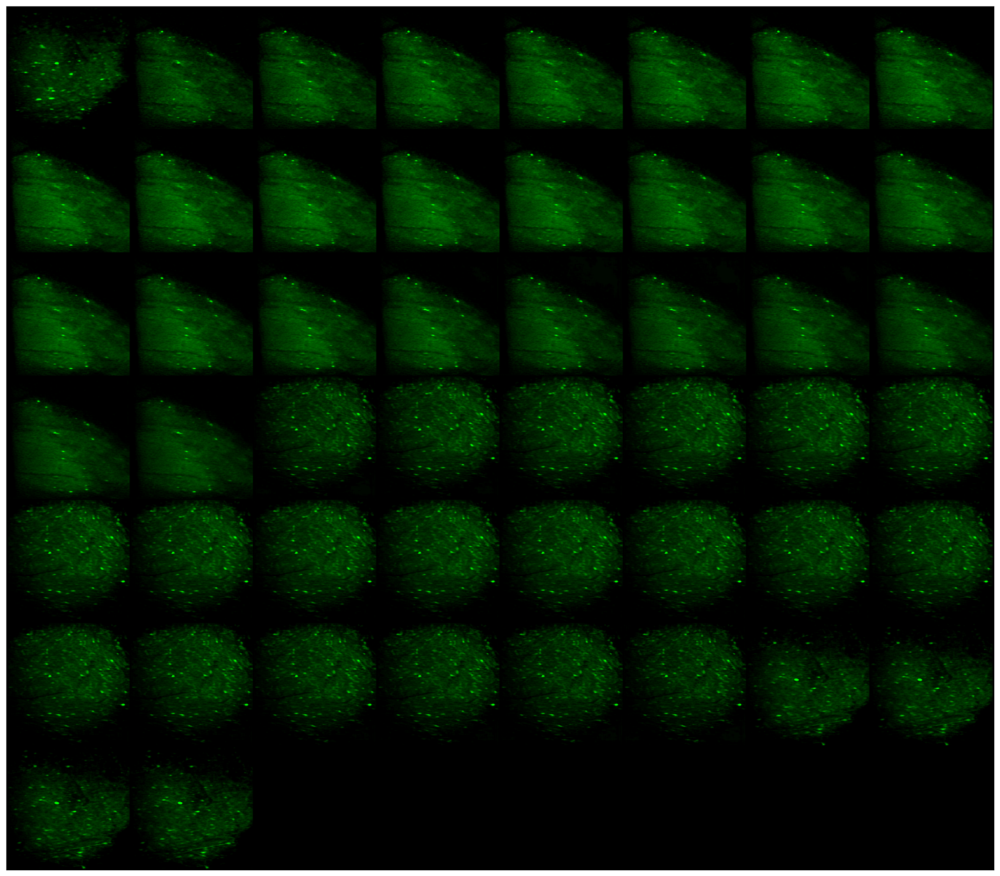

In [13]:
lerp_sample = sample(start_latents=Z_lerp[i], num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

lerp_sample = (1 / 0.18215) * lerp_sample[-1]
with torch.no_grad():
    lerp_sample = vae.decode(lerp_sample).sample 

show_images(lerp_sample)     

  0%|          | 0/999 [00:00<?, ?it/s]

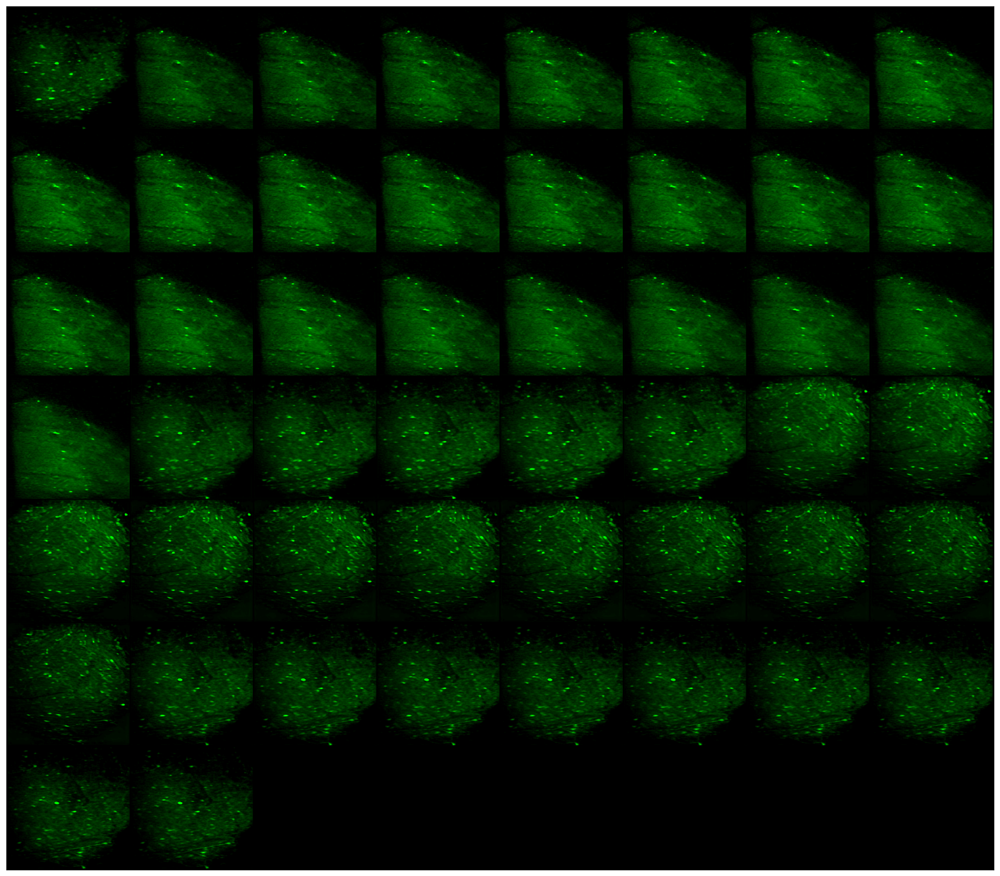

In [14]:
slerp_sample = sample(start_latents=Z_slerp[i], num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

slerp_sample = (1 / 0.18215) * slerp_sample[-1]
with torch.no_grad():
    slerp_sample = vae.decode(slerp_sample).sample 

show_images(slerp_sample)     

  0%|          | 0/999 [00:00<?, ?it/s]

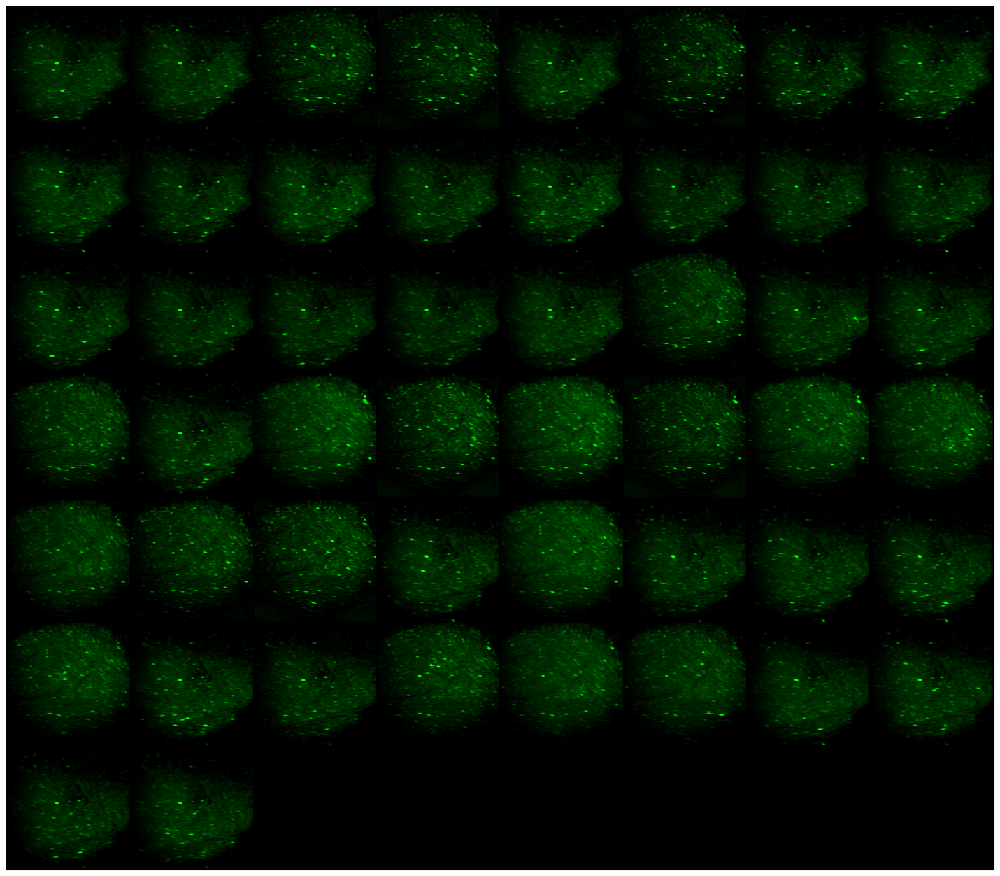

In [15]:
lstm_sample = sample(start_latents=Z_lstm[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

lstm_sample = (1 / 0.18215) * lstm_sample[-1]
with torch.no_grad():
    lstm_sample = vae.decode(lstm_sample).sample 

show_images(lstm_sample)     

  0%|          | 0/999 [00:00<?, ?it/s]

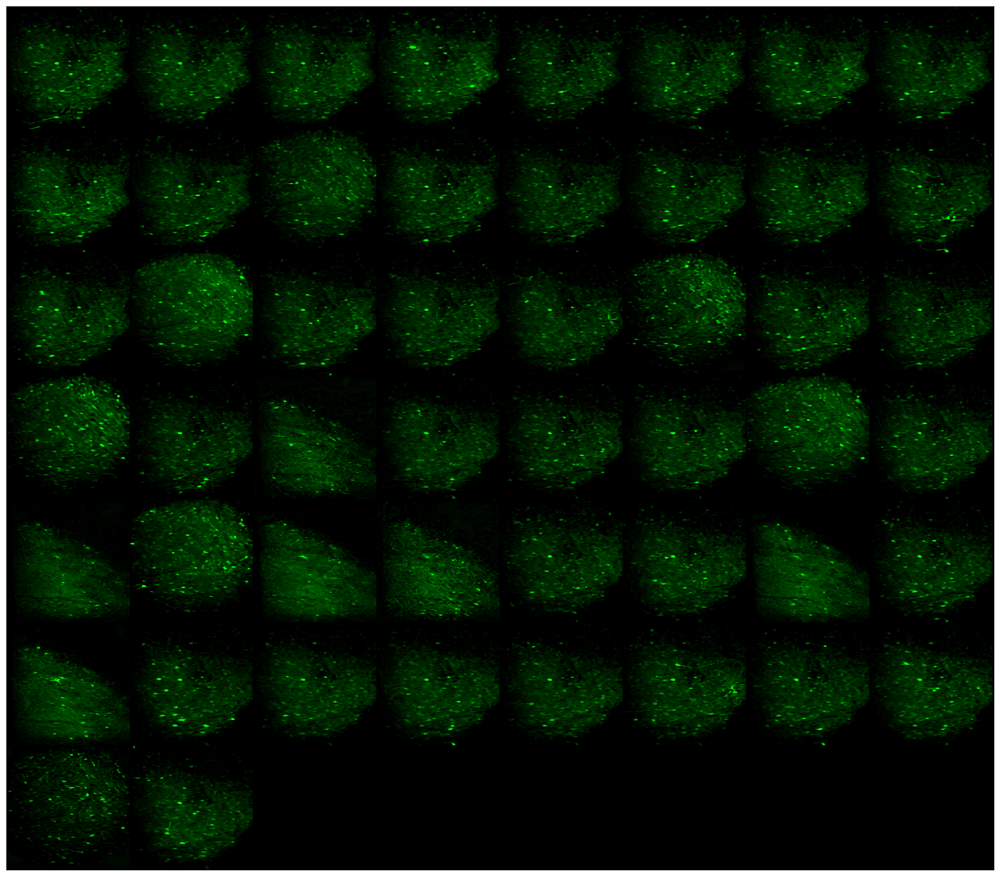

In [16]:
tex1_sample = sample(start_latents=Z_tex1[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

tex1_sample = (1 / 0.18215) * tex1_sample[-1]
with torch.no_grad():
    tex1_sample = vae.decode(tex1_sample).sample 

show_images(tex1_sample)    

  0%|          | 0/999 [00:00<?, ?it/s]

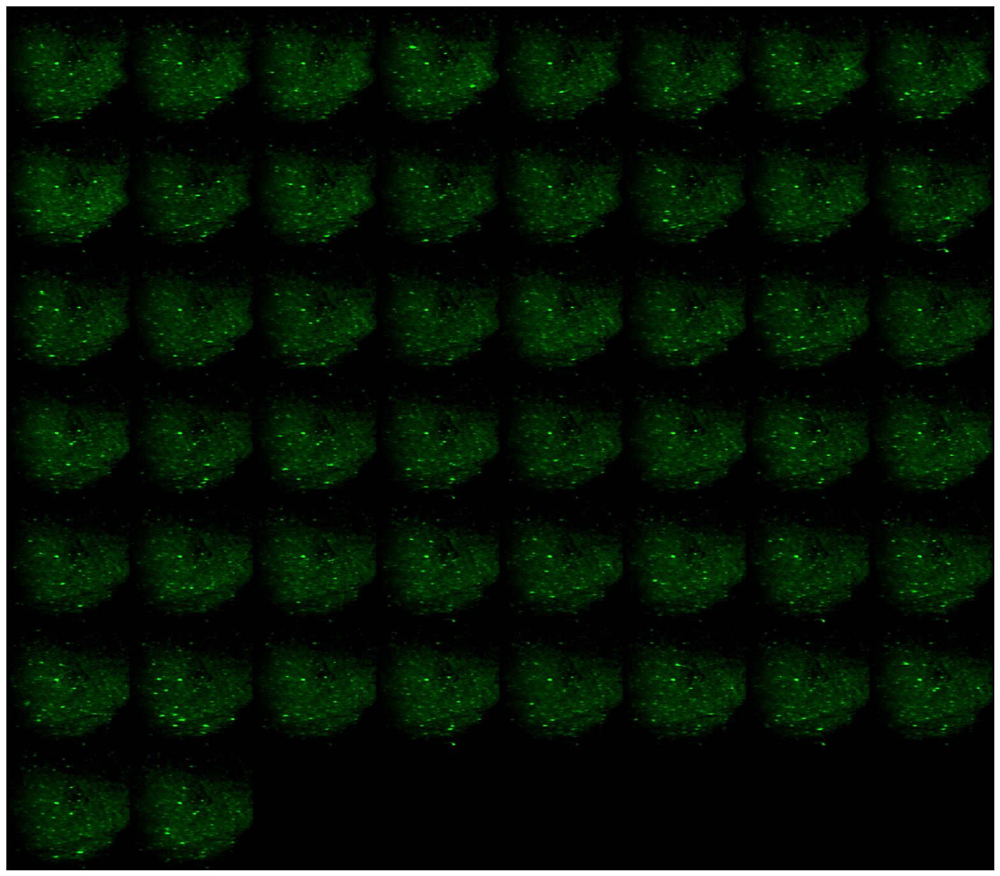

In [17]:
tex2_sample = sample(start_latents=Z_tex2[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

tex2_sample = (1 / 0.18215) * tex2_sample[-1]
with torch.no_grad():
    tex2_sample = vae.decode(tex2_sample).sample 

show_images(tex2_sample)  

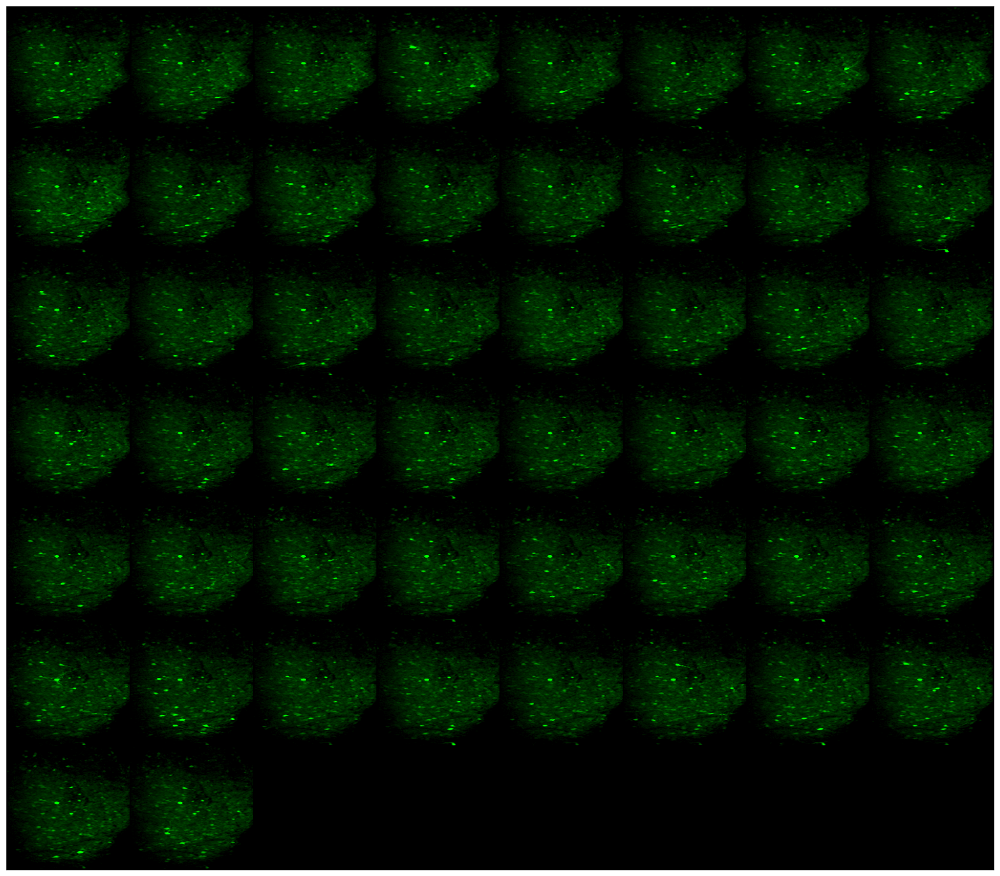

In [18]:
show_images(real_images)